[View in Colaboratory](https://colab.research.google.com/github/sl2820/gct634_Practice/blob/master/Audio_Representations_Trial.ipynb)

# 1. Install Librosa and FFmpeg
Because they are not installed on the Colab instance

In [1]:
!pip install librosa

    100% |████████████████████████████████| 1.6MB 6.8MB/s 
    100% |████████████████████████████████| 327kB 10.5MB/s 
    100% |████████████████████████████████| 2.4MB 8.3MB/s 
    100% |████████████████████████████████| 16.1MB 1.8MB/s 
  Running setup.py bdist_wheel for librosa ... - \ done
  Stored in directory: /root/.cache/pip/wheels/18/b8/10/f0f8f6ac60668a5cd75596cf14c25bb6b3ea1ecd815f058b7e
  Running setup.py bdist_wheel for audioread ... - done
  Stored in directory: /root/.cache/pip/wheels/53/02/90/7b5c4081b7470c550ab605f600bad237dde12a6b8999b11f50
  Running setup.py bdist_wheel for resampy ... - done
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
Successfully built librosa audioread resampy


In [2]:
!apt-get --assume-yes install ffmpeg

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  dbus i965-va-driver libaacs0 libapparmor1 libasound2 libasound2-data libass9
  libasyncns0 libavc1394-0 libavcodec57 libavdevice57 libavfilter6
  libavformat57 libavresample3 libavutil55 libbdplus0 libbluray2
  libboost-filesystem1.62.0 libboost-system1.62.0 libbs2b0 libcaca0 libcairo2
  libcapnp-0.5.3 libcdio-cdda1 libcdio-paranoia1 libcdio13 libchromaprint1
  libcrystalhd3 libdbus-1-3 libdc1394-22 libdrm-amdgpu1 libdrm-common
  libdrm-intel1 libdrm-nouveau2 libdrm-radeon1 libdrm2 libegl1-mesa libelf1
  libfftw3-double3 libflac8 libflite1 libfribidi0 libgbm1 libgl1-mesa-dri
  libgl1-mesa-glx libglapi-mesa libgme0 libgraphite2-3 libgsm1 libharfbuzz0b
  libiec61883-0 libjack-jackd2-0 libllvm5.0 libmirclient9 libmircommon7
  libmircore1 libmirprotobuf3 libmp3lame0 libmpg123-0 libnuma1 libogg0
  libopenal-data libopenal1 libopencv-core3.1 l

In [25]:
!pip install pysoundfile

    100% |████████████████████████████████| 409kB 6.4MB/s 
    100% |████████████████████████████████| 163kB 6.8MB/s 
  Running setup.py bdist_wheel for pycparser ... - \ done
  Stored in directory: /root/.cache/pip/wheels/f2/9a/90/de94f8556265ddc9d9c8b271b0f63e57b26fb1d67a45564511
Successfully built pycparser


### Necessary Libraries


In [0]:
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import os



# 2. Load Audio File and Play It
Load an audio file in the Librosa package and play it

In [4]:
ipd.Audio(librosa.util.example_audio_file())

# 3. Plot Waveform
Load an audio file in the Librosa package and plot the waveform


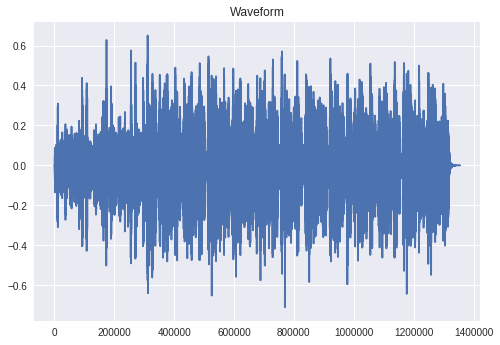

In [5]:
# load an audio file
y, sr = librosa.load(librosa.util.example_audio_file())

plt.plot(y) # Ploting the graph
plt.title('Waveform') # Naming the graph
plt.show() # Showing the title with the graph, without additional information that plot provides


# 4. Plot Spectogram
Load an audio file and plot the spectogram

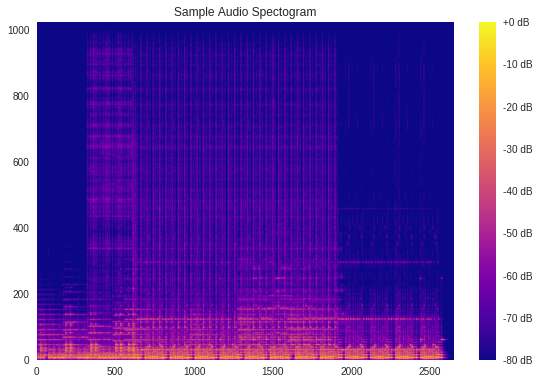

In [6]:
# Load an audio file (done once again for better reference)
y, sr = librosa.load(librosa.util.example_audio_file())

# Compute short-time Fourier Transform
y_stft = librosa.stft(y) 

# Obtain the magnitude of the spectrum
y_mag = np.abs(y_stft)

# Compress the magnitude of the spectrum in a log scale
y_mag_db = librosa.amplitude_to_db(y_mag, ref = np.max)

# Show the Spectrum as an image
plt.imshow(y_mag_db, interpolation='bilinear', origin='lower', aspect='auto', cmap = 'plasma')
# Possible changes for plot color = 'viridis' 'plasma', 'inferno', 'magma', 'prism'
# Plasma or Viridis is the best

# Now plot the image
plt.title ("Sample Audio Spectogram")
plt.colorbar(format = "%+2.0f dB")
plt.tight_layout()
plt.grid('off')  # Shows white grid on the plot
plt.show()

# 5. Plot Log-Spectograms
Load an audio file and plot the mel-spectogram and constant-Q transform

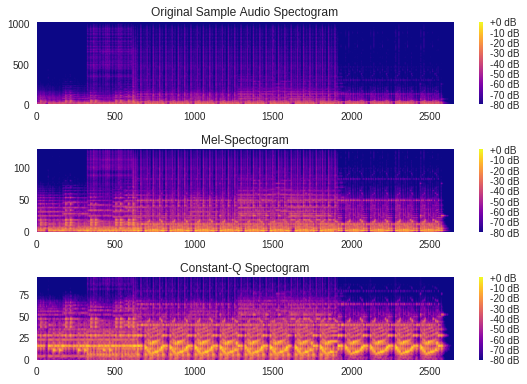

In [12]:
# Load an audio file (to have a better reference)
y, sr = librosa.load(librosa.util.example_audio_file())

# Compute short-time Fourier Transform
y_stft = librosa.stft(y) 

# Obtain the magnitude of the spectrum
y_mag = np.abs(y_stft)

# Compress the magnitude spectrum in a log scale
y_mag_db = librosa.amplitude_to_db(y_mag, ref = np.max)

# Mel Spectogram
y_mag_mel = librosa.feature.melspectrogram(S=y_mag, sr = sr, n_mels = 128)
y_mag_mel_db = librosa.amplitude_to_db(y_mag_mel, ref = np.max)

# Constant-Q Spectogram
y_mag_cqt = librosa.cqt(y, n_bins = 96, bins_per_octave = 12)
y_mag_cqt_db = librosa.amplitude_to_db(y_mag_cqt, ref = np.max)

plt.figure(1)

# Show the Spectrum as an image
plt.subplot(3,1,1)
plt.imshow(y_mag_db, interpolation='bilinear', origin='lower', aspect='auto', cmap = 'plasma')
plt.title ("Original Sample Audio Spectogram")
plt.colorbar(format = "%+2.0f dB")
plt.tight_layout()
plt.grid('off')  

# Mel-Spectogram
plt.subplot(3,1,2)
plt.imshow(y_mag_mel_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Mel-Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

# Constant-Q Spectogram
plt.subplot(3,1,3)
plt.imshow(y_mag_cqt_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Constant-Q Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

plt.show()

# 6. Try My Own Audio File

### 6.1 Local Audio
(for this case, uploaded file on Goolge Colab just for this instance)

In [43]:
# Get Audio File 
cwd = os.getcwd()
print (cwd)
filename = "A$AP Rocky-Fashion Killa.mp3"
# Load an audio file (to have a better reference)
y, sr = librosa.load(filename)
print (y)

/content
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.6578587e-07
 -7.2541734e-06 -3.7913171e-07]


### First, load and play

In [20]:
ipd.Audio(filename)

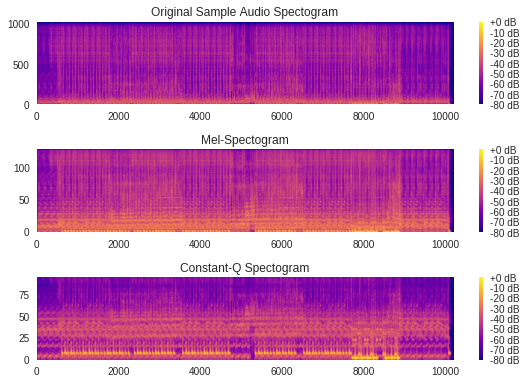

In [21]:
# Load an audio file (to have a better reference)
#y, sr = librosa.load("A$AP Rocky-Fashion Killa.mp3")

# Compute short-time Fourier Transform
y_stft = librosa.stft(y) 

# Obtain the magnitude of the spectrum
y_mag = np.abs(y_stft)

# Compress the magnitude spectrum in a log scale
y_mag_db = librosa.amplitude_to_db(y_mag, ref = np.max)

# Mel Spectogram
y_mag_mel = librosa.feature.melspectrogram(S=y_mag, sr = sr, n_mels = 128)
y_mag_mel_db = librosa.amplitude_to_db(y_mag_mel, ref = np.max)

# Constant-Q Spectogram
y_mag_cqt = librosa.cqt(y, n_bins = 96, bins_per_octave = 12)
y_mag_cqt_db = librosa.amplitude_to_db(y_mag_cqt, ref = np.max)

plt.figure(1)

# Show the Spectrum as an image
plt.subplot(3,1,1)
plt.imshow(y_mag_db, interpolation='bilinear', origin='lower', aspect='auto', cmap = 'plasma')
plt.title ("Original Sample Audio Spectogram")
plt.colorbar(format = "%+2.0f dB")
plt.tight_layout()
plt.grid('off')  

# Mel-Spectogram
plt.subplot(3,1,2)
plt.imshow(y_mag_mel_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Mel-Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

# Constant-Q Spectogram
plt.subplot(3,1,3)
plt.imshow(y_mag_cqt_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Constant-Q Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

plt.show()

### 6-2 Audio from URL


In [28]:
import soundfile as sf
import io

from urllib2 import urlopen
url = "https://raw.githubusercontent.com/librosa/librosa/master/tests/data/test1_44100.wav"



44100


### First, load and play

In [31]:
ipd.Audio(urlopen(url).read())

In [51]:
# Load an audio file (to have a better reference)
data, samplerate = sf.read(io.BytesIO(urlopen(url).read()), dtype='float32')
print(samplerate)
#print (data)
y = data[:,0]
print (y)

44100
[ 1.8310547e-04  9.1552734e-05  1.5258789e-04 ... -9.1552734e-05
 -3.0517578e-05  0.0000000e+00]


<function matplotlib.pyplot.show>

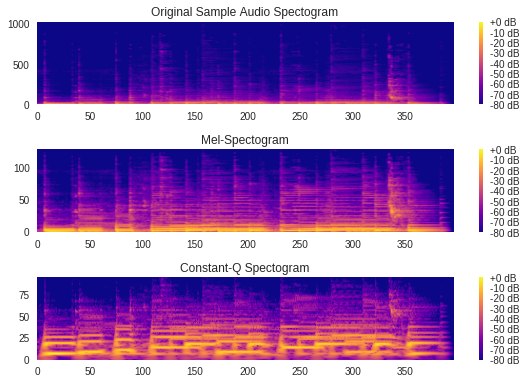

In [52]:
# Load an audio file (to have a better reference)
# Compute short-time Fourier Transform
y_stft = librosa.stft(y) 

# Obtain the magnitude of the spectrum
y_mag = np.abs(y_stft)

# Compress the magnitude spectrum in a log scale
y_mag_db = librosa.amplitude_to_db(y_mag, ref = np.max)

# Mel Spectogram
y_mag_mel = librosa.feature.melspectrogram(S=y_mag, sr = sr, n_mels = 128)
y_mag_mel_db = librosa.amplitude_to_db(y_mag_mel, ref = np.max)

# Constant-Q Spectogram
y_mag_cqt = librosa.cqt(y, n_bins = 96, bins_per_octave = 12)
y_mag_cqt_db = librosa.amplitude_to_db(y_mag_cqt, ref = np.max)

plt.figure(1)

# Show the Spectrum as an image
plt.subplot(3,1,1)
plt.imshow(y_mag_db, interpolation='bilinear', origin='lower', aspect='auto', cmap = 'plasma')
plt.title ("Original Sample Audio Spectogram")
plt.colorbar(format = "%+2.0f dB")
plt.tight_layout()
plt.grid('off')  

# Mel-Spectogram
plt.subplot(3,1,2)
plt.imshow(y_mag_mel_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Mel-Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

# Constant-Q Spectogram
plt.subplot(3,1,3)
plt.imshow(y_mag_cqt_db, interpolation='bilinear', origin = 'lower', 
           aspect = 'auto', cmap='plasma')
plt.title("Constant-Q Spectogram")
plt.colorbar(format = '%+2.0f dB')
plt.tight_layout()
plt.grid('off')

plt.show